<a href="https://colab.research.google.com/github/Bakaos/Curso_UVV/blob/main/MachineLearning_AOP1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Essa é uma atividade online pontuada do tipo "tarefa" e vale 2,0 pontos. O prazo limite para envio é de 08/08/2023 até 11/09/2023.

Você deve gerar o arquivo do google colab AOP1_seuNomeCompleto_sem_acentos.ipynb.

Você deve responder algumas perguntas.
AOP1:
Agora você é o analista de dados de uma empresa.
Você recebeu dois datasets (dataset_1 e dataset_2) para analisar.
Os datasets podem ser baixados deste endereço: https://drive.google.com/drive/folders/1ke5O4GFxqPF67KPO2gowWf36wH-xXLPe?usp=sharing

Estes dois datasets têm 12 características e ainda não foram classificados/agrupados/clusterizados.
Ou seja, ainda não existe a feature ou coluna que indica a classe de cada instância/linha.

Faça uma análise de cada dataset antes de mais nada, verificando:
- Características gerais
- Se tem campos nulos

Uma vez feito isso, faça para cada dataset:
- Determinar o número de clusters usando o método do elbow: escrever um texto com o valor em função do que foi exibido no gráfico.
- Treinar o modelo com kmeans:
kmeans = KMeans(n_clusters = ???, init = 'k-means++', n_init = 10, max_iter=300)
testar com init com o parâmetro random e com k-means++, e cada um com 300 iterações e 1000 iterações.
- Lembrar de gerar o cluster de cada instância:
X['cluster'] = pd.DataFrame(y_kmeans)

- Para cada teste, fazer um plot usando a feature x1 para eixo x, e a feature x2 para o eixo y conforme abaixo. Plotar também os centróides.

#%matplotlib notebook
#c color em funcao do cluster
#s size tamanho do ponto
%matplotlib inline
plt.figure(figsize=(16,12))
plt.scatter(X['x1'], X['x2'], s = 10, c = X['cluster'])
plt.scatter(centroids3[:, 0], centroids3[:, 1], s = 100, c = 'red',label = 'Centroids')
plt.title('Dataset features x1 & x2')
plt.xlabel('x1')
plt.ylabel('x2')
plt.show()

E finalmente, você com um ótimo cientista de dados, deve pesquisar como validar a eficácia do kmeans ao determinar o cluster de cada instância. Para tal, procure no google exemplos dos seguintes métodos e depois aplique para cada teste feito.

- silhouette_score
- calinski_harabasz_score
- davies_bouldin_score

Com os coeficientes de cada teste avalie (escrever uma justificativa) a eficácia da classificação feita pelo kmeans.

Ordem dos testes: determinar o número de clusters, executar o kmeans, determinar o cluster de cada instância, plotar, verificar a acurácia.
Para dataset 1:
1) random com 300 iterações:
2) random com 1000 iterações
3) kmeans++ com 300 iterações
4) kmeans++ com 1000 iterações

Para dataset 2:
1) random com 300 iterações:
2) random com 1000 iterações
3) kmeans++ com 300 iterações
4) kmeans++ com 1000 iterações

Deixar no seu arquivo .ipynb todos os prints, plots, resultados e análises.
Arquivo .ipynb sem todas estas informações salvas não serão avaliados.

Atenção: Enviar o seu arquivo AOP1_SeuNomeCompleto_sem_acentos.ipynb zipado(.zip), com a solução(responder no próprio arquivo: por os códigos solicitados, a resposta das perguntas).
O nome do arquivo não pode ter espaço, acentos, nem caracteres: @, #,$,%, &, *, ^, ~, ´, `, ç, - (hífen)

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import pairwise_distances
from google.colab import files

%matplotlib inline


In [ ]:
from google.colab import drive
drive.mount ('/content/drive')
dt1 = pd.read_csv('/content/drive/MyDrive/dataset_1.csv', sep=';')
dt2 = pd.read_csv('/content/drive/MyDrive/dataset_2.csv', sep=';')
# as variaveis a seguir serao utilizadas nas analises
dt1_r300 = dt1
dt1_r1000 = dt1
dt1_km300 = dt1
dt1_km1000 = dt1
dt2_r300 = dt2
dt2_r1000 = dt2
dt2_km300 = dt2
dt2_km1000 = dt2

Mounted at /content/drive


In [ ]:
dt1.head()

,X1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12
0,8.626019,1.947556,-3.650097,-3.554988,5.764661,7.848636,7.860381,4.971057,3.125414,-8.346091,-5.397849,7.858297
1,-4.298631,-2.479778,5.003003,2.708729,7.249667,0.013919,-8.040928,4.036528,4.039205,2.368104,6.971939,0.087805
2,-8.848742,1.951031,3.624026,-9.739709,-0.078908,-6.745458,1.526731,-7.796831,2.725701,-3.680006,7.298588,-7.523419
3,-10.461907,6.591355,3.683431,6.939596,6.355922,-8.501900,-2.462584,-10.038042,8.493794,2.977859,-3.455197,-8.162983
4,1.310533,-7.091862,-8.056669,4.295828,-9.754949,5.919896,3.796582,-8.742766,-9.084667,7.831947,-2.929558,-2.754675


In [ ]:
dt2.head()

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12
0,-8.089047,-5.818536,3.866754,5.775059,7.702591,-1.376691,3.594013,-6.808177,-4.180117,8.452810,-11.485139,-8.536097
1,-10.737993,-8.971126,-2.103010,7.880418,-4.338573,-0.496815,-9.312761,-6.737319,8.985369,9.982048,-9.468952,8.021616
2,8.311043,1.395897,-6.382220,3.684960,1.968494,-2.890885,-7.668416,2.931867,0.569600,7.415585,0.332117,7.068037
3,4.932782,8.649455,-5.623264,-8.834867,-8.274160,2.383717,0.378244,1.636102,-5.473114,-1.293068,0.994760,-0.684647
4,0.599589,-1.254499,-0.607769,-1.517817,4.233317,1.485544,6.871345,-0.679799,0.869733,2.941368,0.274214,6.025676


In [ ]:
# verificando se os conjuntos possuem valor de sentinela
print('data set 1 NANs :\n',dt1.isna().sum(), dt1.dtypes)
print('data set 2 NANs :\n',dt2.isna().sum(), dt1.dtypes)
# Não há valores de sentinela e todos os valores são do tipo float64, e portanto validos

data set 1 NANs :
 X1     0
x2     0
x3     0
x4     0
x5     0
x6     0
x7     0
x8     0
x9     0
x10    0
x11    0
x12    0
dtype: int64 X1     float64
x2     float64
x3     float64
x4     float64
x5     float64
x6     float64
x7     float64
x8     float64
x9     float64
x10    float64
x11    float64
x12    float64
dtype: object
data set 2 NANs :
 x1     0
x2     0
x3     0
x4     0
x5     0
x6     0
x7     0
x8     0
x9     0
x10    0
x11    0
x12    0
dtype: int64 X1     float64
x2     float64
x3     float64
x4     float64
x5     float64
x6     float64
x7     float64
x8     float64
x9     float64
x10    float64
x11    float64
x12    float64
dtype: object


1 7849104.252696793
2 6857345.851041716
3 6171695.050223823
4 5646457.986345675
5 5154977.005094243
6 4804946.045538897
7 4468437.100255505
8 4170240.82099365
9 3924188.5579951853
10 3599678.521806207
11 3297287.3485937854
12 3166003.5809668954
13 2989607.2804796845
14 2837503.4414964514
15 2625949.7937621865
16 2439200.28155479
17 2351848.658341001
18 2189045.0928918123
19 1845213.1926370435
20 1919181.5605304271
21 1602638.910085125
22 1611707.3989628784
23 1538532.8175418049
24 1457271.9787241402
25 1440180.982775235
26 1102719.2313539693
27 1201891.232628176
28 1156463.5295870546
29 1012576.6589608802
30 915263.2969220877
31 878659.0515367461
32 746290.2922739944
33 805044.5888021113
34 724085.7850585266
35 564723.8890193019
36 534630.7372977512
37 490076.36772985547
38 642820.1723740303
39 566263.5849757975
40 565516.6921020711
41 451112.6652729354
42 482537.26093434484
43 319812.00613676803
44 219112.98089354223
45 421779.8070718031
46 401341.0406651442
47 273874.66694495047
48 3

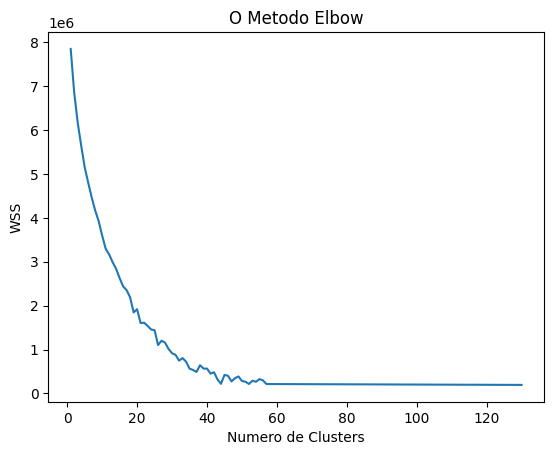

In [ ]:
# Metodo Elbow
#%matplotlib notebook
%matplotlib inline

wcss_dt1 = [] # lista vazia que acumula os erros quadraticos

# após a execução do metodo elbow foi escolhido 49 como numero de clusters

for i in range(1, 131):
    kmeans_dt1 = KMeans(n_clusters = i, init = 'random', n_init='auto')
    kmeans_dt1.fit(dt1)
    print (i,kmeans_dt1.inertia_)
    wcss_dt1.append(kmeans_dt1.inertia_)

plt.plot(range(1, 131), wcss_dt1)
plt.title('O Metodo Elbow')
plt.xlabel('Numero de Clusters')
plt.ylabel('WSS') #within cluster sum of squares
plt.show()

1 45193158.9737916
2 41721505.42787493
3 39263744.58238621
4 37225019.146649845
5 35574296.04053673
6 34111988.01421995
7 32832133.901699666
8 31903079.873806294
9 30911694.08117746
10 30167188.98976394
11 29431863.293333314
12 28597309.609494045
13 27904728.052241303
14 27369709.295838617
15 26807016.64932047
16 26195674.366737667
17 25587337.996091366
18 25155685.961534597
19 24669568.40320527
20 24281249.23004706
21 23841452.736120384
22 23581952.073142026
23 23291857.005803768
24 22977486.813315757
25 22556830.23603253
26 21947693.873082966
27 21726555.112830035
28 21633241.057727348
29 20997704.156602353
30 20887793.712152824
31 20316731.369221963
32 20361950.20673763
33 20044290.86087919
34 19755019.749597892
35 19560244.414882466
36 19266000.497829624
37 19208020.954080418
38 19105014.367588464
39 18492030.545477346
40 18526896.40878275
41 18217072.324311256
42 18064176.726964384
43 17967714.531666346
44 17578536.704007804
45 17592704.807640687
46 17314725.285216898
47 17072848.

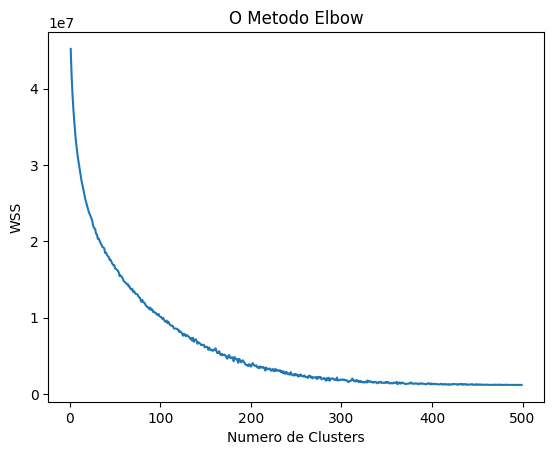

In [ ]:
# Metodo Elbow
#%matplotlib notebook
%matplotlib inline

wcss = [] # lista vazia que acumula os erros quadraticos

#agrupar a base de dados em 3 clusters/grupos: simulando nossas classes/categorias.
kmeans = KMeans(n_clusters = 3, init = 'random')

# após a execução do metodo elbow foi escolhido 300 como numero de clusters com uma distancia de 216630.0221599069

for i in range(1, 500):
    kmeans_dt2 = KMeans(n_clusters = i, init = 'random', n_init='auto')
    kmeans_dt2.fit(dt2)
    print (i,kmeans_dt2.inertia_)
    wcss.append(kmeans_dt2.inertia_)

plt.plot(range(1, 500), wcss)
plt.title('O Metodo Elbow')
plt.xlabel('Numero de Clusters')
plt.ylabel('WSS') #within cluster sum of squares
plt.show()

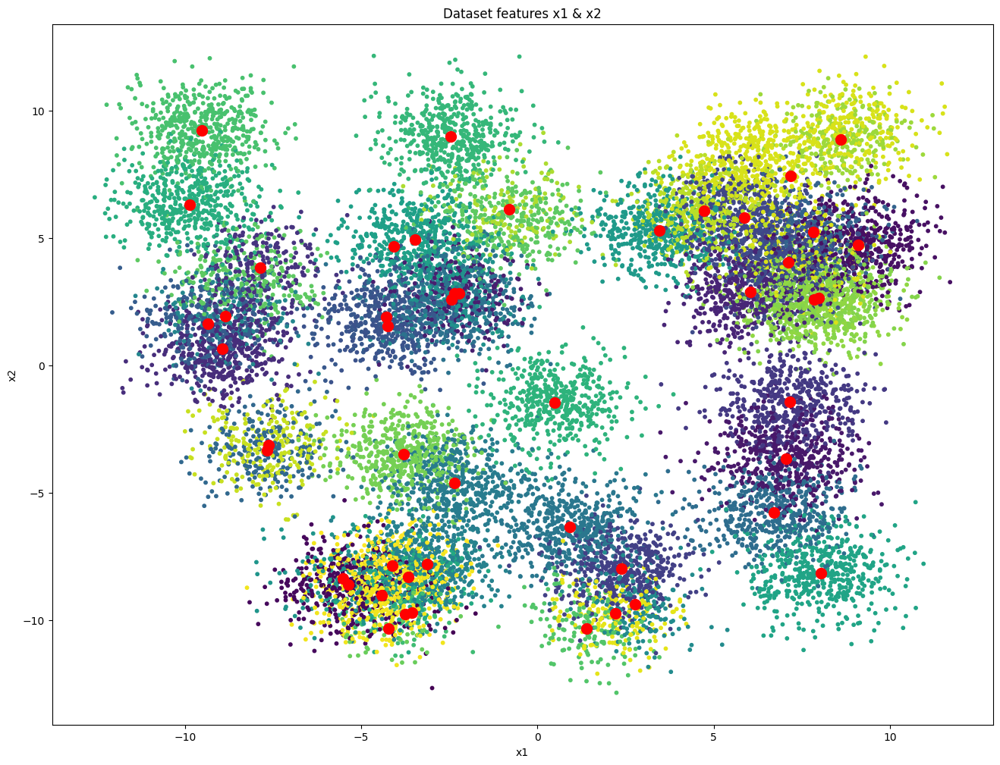

In [ ]:
kmeans_dt1_r300 = KMeans(n_clusters = 49, init = 'random', n_init = 10, max_iter=300)
kmeans_dt1_r300.fit(dt1_r300)
cluster_dt1_r300 = kmeans_dt1_r300.labels_

plt.figure(figsize=(16,12))
plt.scatter(dt1_r300['X1'], dt1_r300['x2'], s = 10, c = cluster_dt1_r300)
plt.scatter(kmeans_dt1_r300.cluster_centers_[:, 0], kmeans_dt1_r300.cluster_centers_[:, 1], s = 100, c = 'red',label = 'Centroids')
plt.title('Dataset features x1 & x2')
plt.xlabel('x1')
plt.ylabel('x2')
plt.show()

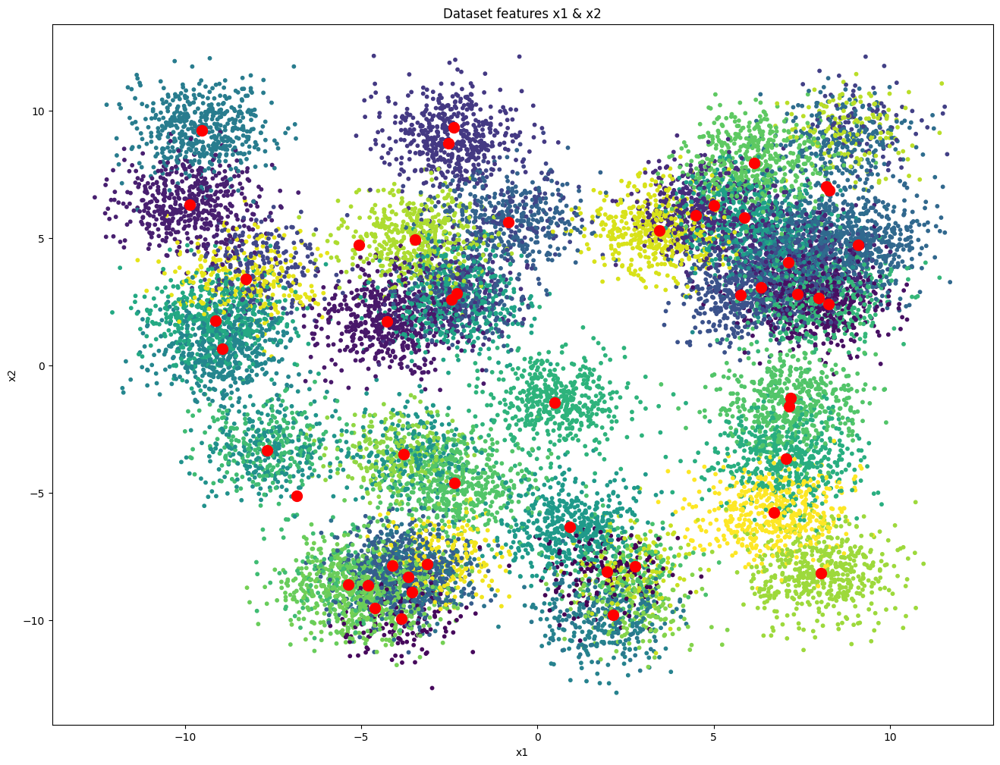

In [ ]:
kmeans_dt1_r1000 = KMeans(n_clusters = 49, init = 'random', n_init = 10, max_iter=1000)
kmeans_dt1_r1000.fit(dt1_r1000)
cluster_dt1_r1000 = kmeans_dt1_r1000.labels_

plt.figure(figsize=(16,12))
plt.scatter(dt1_r1000['X1'], dt1_r1000['x2'], s = 10, c = cluster__dt1_r1000)
plt.scatter(kmeans_dt1_r1000.cluster_centers_[:, 0], kmeans_dt1_r1000.cluster_centers_[:, 1], s = 100, c = 'red',label = 'Centroids')
plt.title('Dataset features x1 & x2')
plt.xlabel('x1')
plt.ylabel('x2')
plt.show()

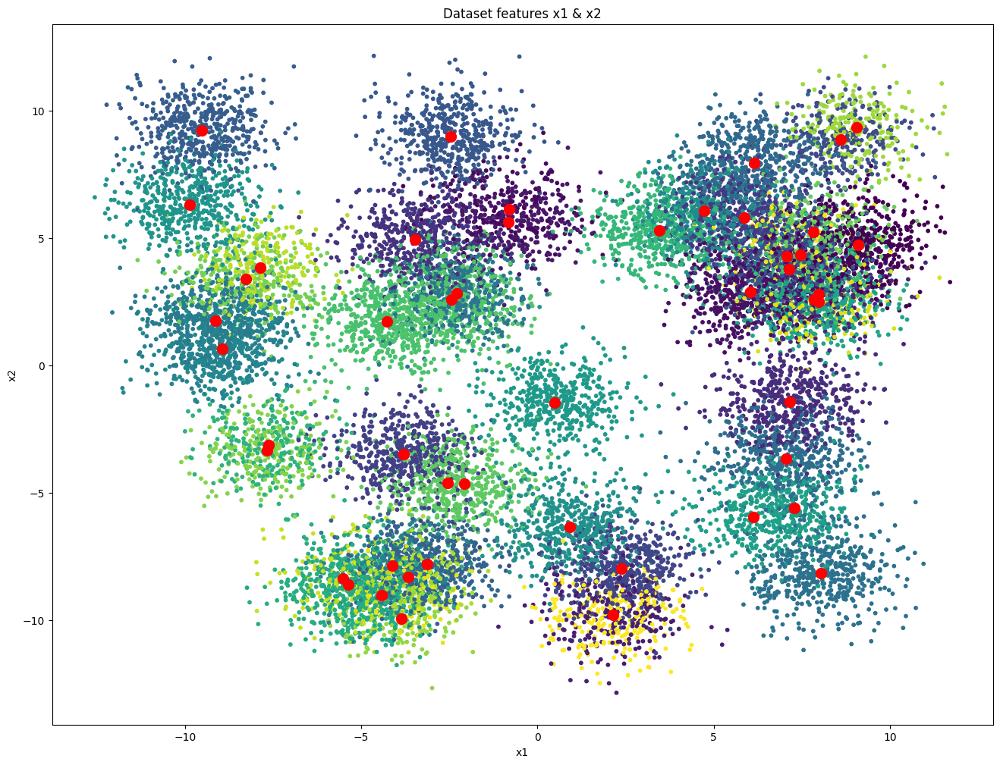

In [ ]:
kmeans_dt1_km300 = KMeans(n_clusters = 49, init = 'k-means++', n_init = 10, max_iter=300)
kmeans_dt1_km300.fit(dt1_km300)
cluster_dt1_km300 = kmeans_dt1_km300.labels_

plt.figure(figsize=(16,12))
plt.scatter(dt1_km300['X1'], dt1_km300['x2'], s = 10, c = cluster__dt1_km300)
plt.scatter(kmeans_dt1_km300.cluster_centers_[:, 0], kmeans_dt1_km300.cluster_centers_[:, 1], s = 100, c = 'red',label = 'Centroids')
plt.title('Dataset features x1 & x2')
plt.xlabel('x1')
plt.ylabel('x2')
plt.show()

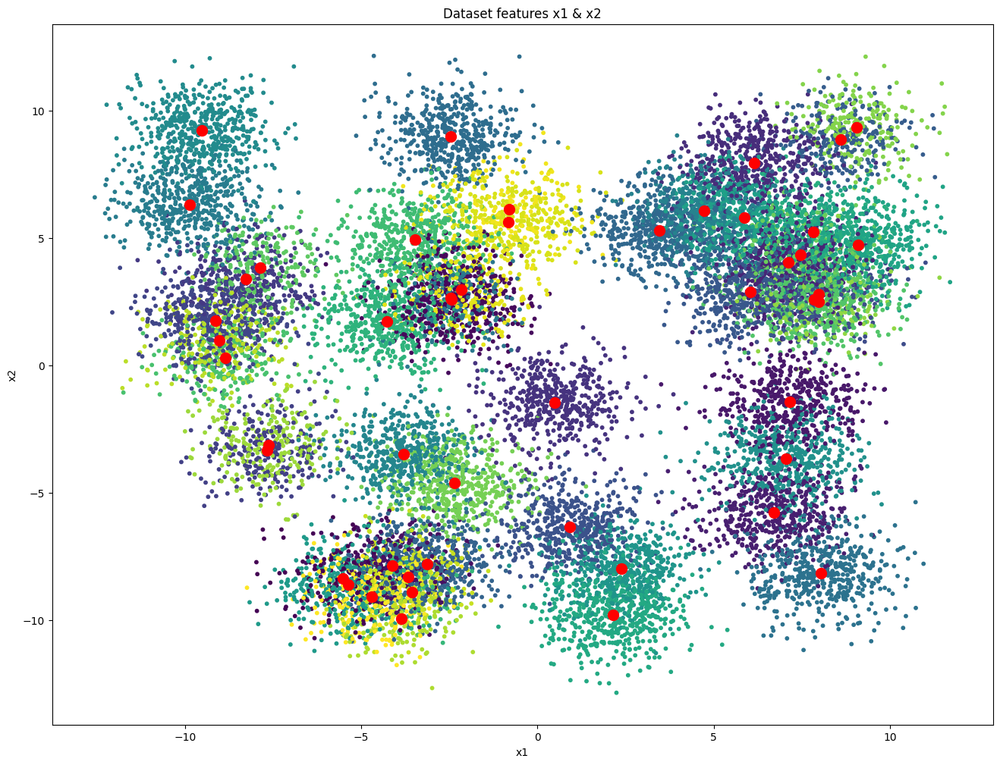

In [ ]:
kmeans_dt1_km1000 = KMeans(n_clusters = 49, init = 'k-means++', n_init = 10, max_iter=1000)
kmeans_dt1_km1000.fit(dt1_km1000)
cluster_dt1_km1000 = kmeans_dt1_km1000.labels_

plt.figure(figsize=(16,12))
plt.scatter(dt1_km1000['X1'], dt1_km1000['x2'], s = 10, c = cluster_dt1_km1000)
plt.scatter(kmeans_dt1_km1000.cluster_centers_[:, 0], kmeans_dt1_km1000.cluster_centers_[:, 1], s = 100, c = 'red',label = 'Centroids')
plt.title('Dataset features x1 & x2')
plt.xlabel('x1')
plt.ylabel('x2')
plt.show()

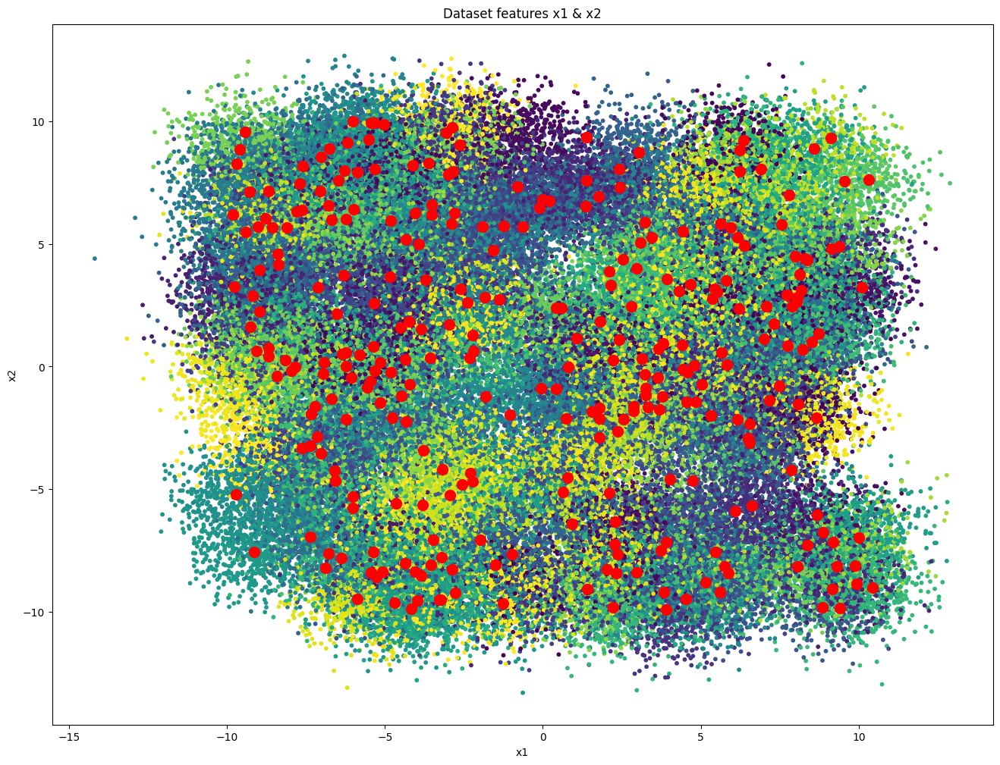

In [ ]:
kmeans_dt2_r300 = KMeans(n_clusters = 300, init = 'random', n_init = 10, max_iter=300)
kmeans_dt2_r300.fit(dt2_r300)
cluster_dt2_r300 = kmeans_dt2_r300.labels_

plt.figure(figsize=(16,12))
plt.scatter(dt2_r300['x1'], dt2_r300['x2'], s = 10, c = cluster_dt2_r300)
plt.scatter(kmeans_dt2_r300.cluster_centers_[:, 0], kmeans_dt2_r300.cluster_centers_[:, 1], s = 100, c = 'red',label = 'Centroids')
plt.title('Dataset features x1 & x2')
plt.xlabel('x1')
plt.ylabel('x2')
plt.show()

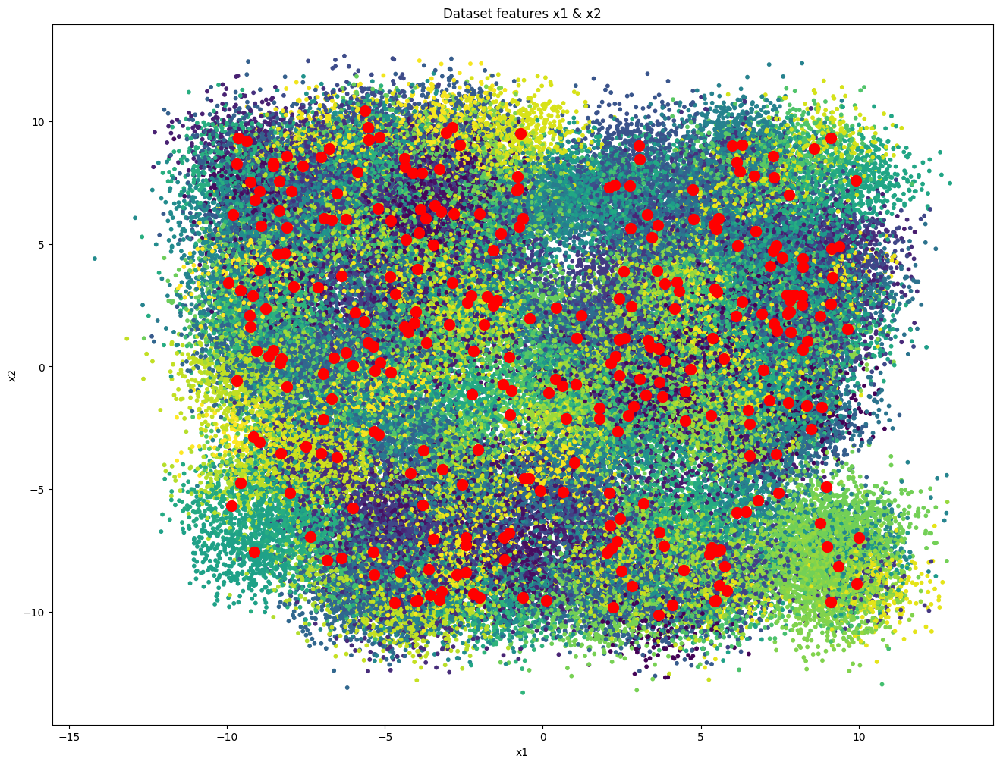

In [ ]:
kmeans_dt2_r1000 = KMeans(n_clusters = 300, init = 'random', n_init = 10, max_iter=1000)
kmeans_dt2_r1000.fit(dt2_r1000)
cluster_dt2_r1000 = kmeans_dt2_r1000.labels_

plt.figure(figsize=(16,12))
plt.scatter(dt2_r1000['x1'], dt2_r1000['x2'], s = 10, c = cluster_dt2_r1000)
plt.scatter(kmeans_dt2_r1000.cluster_centers_[:, 0], kmeans_dt2_r1000.cluster_centers_[:, 1], s = 100, c = 'red',label = 'Centroids')
plt.title('Dataset features x1 & x2')
plt.xlabel('x1')
plt.ylabel('x2')
plt.show()

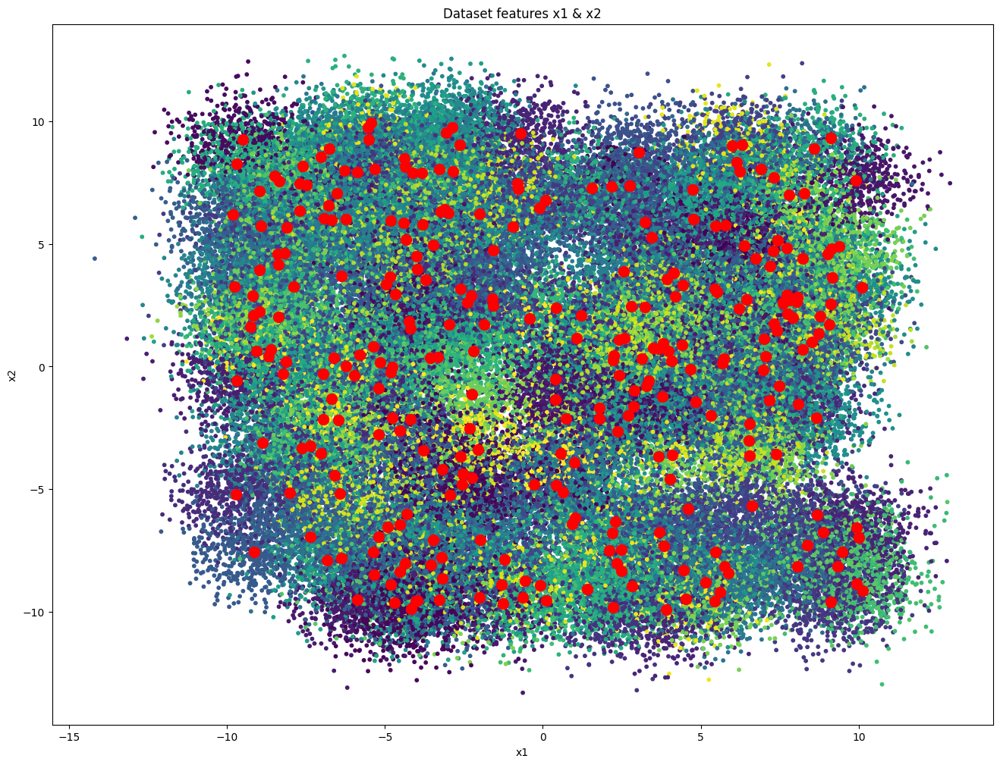

In [ ]:
kmeans_dt2_km300 = KMeans(n_clusters = 300, init = 'k-means++', n_init = 10, max_iter=300)
kmeans_dt2_km300.fit(dt2_km300)
cluster_dt2_km300 = kmeans_dt2_km300.labels_

plt.figure(figsize=(16,12))
plt.scatter(dt2_km300['x1'], dt2_km300['x2'], s = 10, c = cluster_dt2_km300)
plt.scatter(kmeans_dt2_km300.cluster_centers_[:, 0], kmeans_dt2_km300.cluster_centers_[:, 1], s = 100, c = 'red',label = 'Centroids')
plt.title('Dataset features x1 & x2')
plt.xlabel('x1')
plt.ylabel('x2')
plt.show()

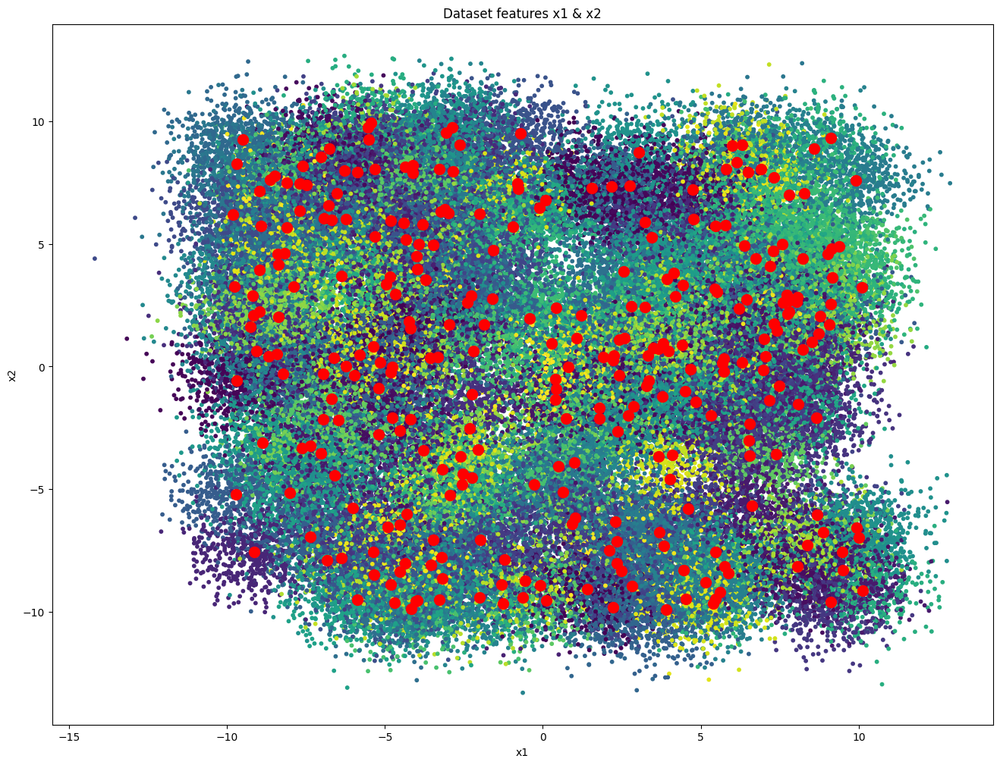

In [ ]:
kmeans_dt2_km1000 = KMeans(n_clusters = 300, init = 'k-means++', n_init = 10, max_iter=1000)
kmeans_dt2_km1000.fit(dt2_km1000)
cluster_dt2_km1000 = kmeans_dt2_km1000.labels_

plt.figure(figsize=(16,12))
plt.scatter(dt2_km1000['x1'], dt2_km1000['x2'], s = 10, c = cluster_dt2_km1000)
plt.scatter(kmeans_dt2_km1000.cluster_centers_[:, 0], kmeans_dt2_km1000.cluster_centers_[:, 1], s = 100, c = 'red',label = 'Centroids')
plt.title('Dataset features x1 & x2')
plt.xlabel('x1')
plt.ylabel('x2')
plt.show()

In [ ]:
# tecnicas de validacao: avaliar como o modelo K-Means se comportou.

# são indicativos de melhor clustering:
# Silhouette valores maiores.

print('Data Set 1:\n')
print("random com 300 iterações -\tSilhouette Score ", silhouette_score(dt1_r300, cluster_dt1_r300))
print("random com 1000 iterações -\tSilhouette Score ", silhouette_score(dt1_r1000, cluster_dt1_r1000))
print("k-means++ com 300 iterações -\tSilhouette Score ", silhouette_score(dt1_km300, cluster_dt1_km300))
print("k-means++ com 1000 iterações -\tSilhouette Score ", silhouette_score(dt1_km1000, cluster_dt1_km1000))

print('\nData Set 2:\n')
print("random com 300 iterações -\tSilhouette Score ", silhouette_score(dt2_r300, cluster_dt2_r300))
print("random com 1000 iterações -\tSilhouette Score ", silhouette_score(dt2_r1000, cluster_dt2_r1000))
print("k-means++ com 300 iterações -\tSilhouette Score ", silhouette_score(dt2_km300, cluster_dt2_km300))
print("k-means++ com 1000 iterações -\tSilhouette Score ", silhouette_score(dt2_km1000, cluster_dt2_km1000))

Data Set 1:

random com 300 iterações -	Silhouette Score  0.6509987405220232
random com 1000 iterações -	Silhouette Score  0.6179421077954954
k-means++ com 300 iterações -	Silhouette Score  0.706575045206213
k-means++ com 1000 iterações -	Silhouette Score  0.7171284724194259

Data Set 2:

random com 300 iterações -	Silhouette Score  0.5258392533339069
random com 1000 iterações -	Silhouette Score  0.541359072429157
k-means++ com 300 iterações -	Silhouette Score  0.737613612409099
k-means++ com 1000 iterações -	Silhouette Score  0.7413510941247696


In [ ]:
# tecnicas de validacao: avaliar como o modelo K-Means se comportou.

# são indicativos de melhor clustering:
# Calinski-Harabasz valores maiores.

print('Data Set 1:\n')
print("random com 300 iterações -\tCalinski-Harabasz Score: ", calinski_harabasz_score(dt1_r300, cluster_dt1_r300))
print("random com 1000 iterações -\tCalinski-Harabasz Score: ", calinski_harabasz_score(dt1_r1000, cluster_dt1_r1000))
print("k-means++ com 300 iterações -\tCalinski-Harabasz Score: ", calinski_harabasz_score(dt1_km300, cluster_dt1_km300))
print("k-means++ com 1000 iterações -\tCalinski-Harabasz Score: ", calinski_harabasz_score(dt1_km1000, cluster_dt1_km1000))

print('\nData Set 2:\n')
print("random com 300 iterações -\tCalinski-Harabasz Score: ", calinski_harabasz_score(dt2_r300, cluster_dt2_r300))
print("random com 1000 iterações -\tCalinski-Harabasz Score: ", calinski_harabasz_score(dt2_r1000, cluster_dt2_r1000))
print("k-means++ com 300 iterações -\tCalinski-Harabasz Score: ", calinski_harabasz_score(dt2_km300, cluster_dt2_km300))
print("k-means++ com 1000 iterações -\tCalinski-Harabasz Score: ", calinski_harabasz_score(dt2_km1000, cluster_dt2_km1000))

Data Set 1:

random com 300 iterações -	Calinski-Harabasz Score:  8682.0251250926
random com 1000 iterações -	Calinski-Harabasz Score:  10823.414168120571
k-means++ com 300 iterações -	Calinski-Harabasz Score:  18866.035374757943
k-means++ com 1000 iterações -	Calinski-Harabasz Score:  19141.817385165523

Data Set 2:

random com 300 iterações -	Calinski-Harabasz Score:  53926.77973731116
random com 1000 iterações -	Calinski-Harabasz Score:  53809.38754705809
k-means++ com 300 iterações -	Calinski-Harabasz Score:  185531.95579513998
k-means++ com 1000 iterações -	Calinski-Harabasz Score:  186094.85085180157


In [ ]:
def davies_bouldin_score(X, labels):
    num_clusters = len(set(labels))
    cluster_centers = [X[labels == i].mean(axis=0) for i in range(num_clusters)]
    cluster_distances = np.zeros((num_clusters, num_clusters))

    for i in range(num_clusters):
        for j in range(i + 1, num_clusters):
            cluster_distances[i, j] = np.linalg.norm(cluster_centers[i] - cluster_centers[j])
            cluster_distances[j, i] = cluster_distances[i, j]

    avg_cluster_distances = [max([cluster_distances[i, j] for j in range(num_clusters) if j != i]) for i in range(num_clusters)]
    db_score = np.mean(avg_cluster_distances)
    return db_score

In [ ]:
# tecnicas de validacao: avaliar como o modelo K-Means se comportou.

# são indicativos de melhor clustering:
# Davies-Bouldin valores menores.

print('Data Set 1:\n')
print("random com 300 iterações -\tDavies-Bouldin Score: ", davies_bouldin_score(dt1_r300, cluster_dt1_r300))
print("random com 1000 iterações -\tDavies-Bouldin Score: ", davies_bouldin_score(dt1_r1000, cluster_dt1_r1000))
print("k-means++ com 300 iterações -\tDavies-Bouldin Score: ", davies_bouldin_score(dt1_km300, cluster_dt1_km300))
print("k-means++ com 1000 iterações -\tDavies-Bouldin Score: ", davies_bouldin_score(dt1_km1000, cluster_dt1_km1000))

print('\nData Set 2:\n')
print("random com 300 iterações -\tDavies-Bouldin Score: ", davies_bouldin_score(dt2_r300, cluster_dt2_r300))
print("random com 1000 iterações -\tDavies-Bouldin Score: ", davies_bouldin_score(dt2_r1000, cluster_dt2_r1000))
print("k-means++ com 300 iterações -\tDavies-Bouldin Score: ", davies_bouldin_score(dt2_km300, cluster_dt2_km300))
print("k-means++ com 1000 iterações -\tDavies-Bouldin Score: ", davies_bouldin_score(dt2_km1000, cluster_dt2_km1000))

Data Set 1:

random com 300 iterações -	Davies-Bouldin Score:  49.392414419173406
random com 1000 iterações -	Davies-Bouldin Score:  48.69658270230742
k-means++ com 300 iterações -	Davies-Bouldin Score:  49.286209348885
k-means++ com 1000 iterações -	Davies-Bouldin Score:  49.767372591409455

Data Set 2:

random com 300 iterações -	Davies-Bouldin Score:  220.1864690716392
random com 1000 iterações -	Davies-Bouldin Score:  217.87805738256944
k-means++ com 300 iterações -	Davies-Bouldin Score:  225.5484435142499
k-means++ com 1000 iterações -	Davies-Bouldin Score:  225.6656883640027


A melhor performance veio com a execução do algoritimo com os parametros k-means++ e 1000 iterações para ambos os conjuntos, podemos apontar como exceções notaveis o teste Calinski-Harabasz que apontou pouca melhoria entre 300 e 1000 iterações e pelo teste Davies-Bouldin que apontou uma piora de performance em relação aos parametros random porem, essas diferenças foram pequenas em relações aos ganhos de acordo com as demais analises levando portando à conclusão apontada.